# Trackpy Analysis from Cellpose Masks
This notebook extracts cell centroids from Cellpose output masks and tracks them using Trackpy.

In [1]:
# === Imports ===
import os
import numpy as np
import pandas as pd
from skimage.io import imread
from skimage.measure import regionprops, label
import matplotlib.pyplot as plt
import trackpy as tp
from tqdm import tqdm
from IPython.display import Video

100%|█████████████████████████████████████████████████████████████████████████████| 289/289 [01:10<00:00,  4.08it/s]


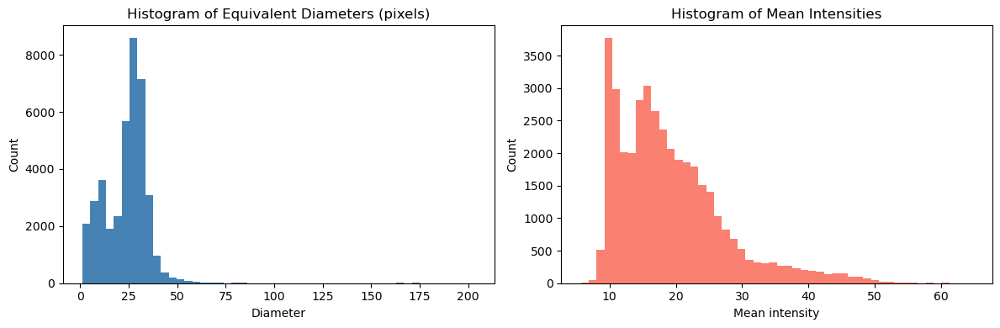

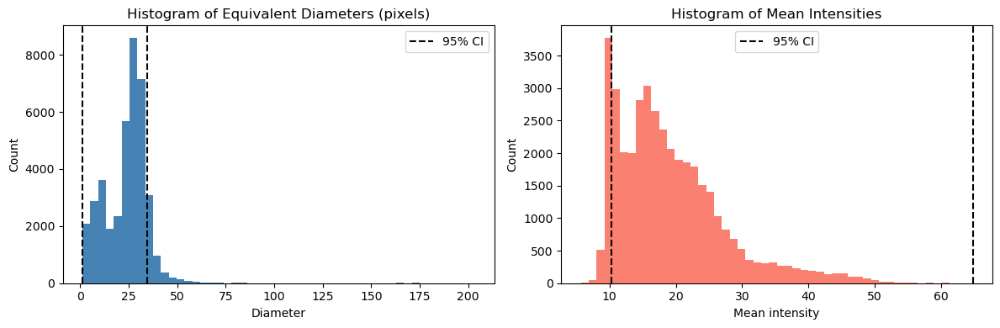

In [6]:
# === Extract equivalent diameter and mean intensity for all masks ===
czi_filename = '/mnt/storage_sda/Projects/imaging_data/mix_dilution_FibronectinPDK_24hr_5x_1x_JDF_9may2025-Scene-29-E3-E03/'
mask_dir = czi_filename + 'cellpose_outputs'
image_dir = czi_filename + 'raw_rgb_frames'

# List directories of all masks and RGB files
mask_files = sorted([f for f in os.listdir(mask_dir) if f.endswith('_mask.tif')])
image_files = sorted([f for f in os.listdir(image_dir) if f.endswith('.png') or f.endswith('.tif')])

diameter_list = []
intensity_list = []


for frame_num, (mask_fname, image_fname) in enumerate(tqdm(zip(mask_files, image_files), total=len(mask_files))):
    # Read in the data
    mask = imread(os.path.join(mask_dir, mask_fname))
    image = imread(os.path.join(image_dir, image_fname))

    # Average over all 3 color channels
    if image.ndim == 3:
        image = image.mean(axis=-1)

    # Compute region properties (object/cell diameter and intensity)
    regions = regionprops(label(mask), intensity_image=image)
    for r in regions:
        diameter = r.equivalent_diameter
        intensity = r.mean_intensity

        diameter_list.append(diameter)
        intensity_list.append(intensity)


# === Plot histograms ===
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].hist(diameter_list, bins=50, color='steelblue')
axs[0].set_title('Histogram of Equivalent Diameters (pixels)')
axs[0].set_xlabel('Diameter')
axs[0].set_ylabel('Count')

axs[1].hist(intensity_list, bins=50, color='salmon')
axs[1].set_title('Histogram of Mean Intensities')
axs[1].set_xlabel('Mean intensity')
axs[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

# Calculate 99% confidence intervals
diameter_ci = np.percentile(diameter_list, [0,90])
intensity_ci = np.percentile(intensity_list, [10,100])

fig, axs = plt.subplots(1, 2, figsize=(12, 4))

# Histogram for diameters
axs[0].hist(diameter_list, bins=50, color='steelblue')
axs[0].axvline(diameter_ci[0], color='black', linestyle='--', label='95% CI')
axs[0].axvline(diameter_ci[1], color='black', linestyle='--')
axs[0].set_title('Histogram of Equivalent Diameters (pixels)')
axs[0].set_xlabel('Diameter')
axs[0].set_ylabel('Count')
axs[0].legend()

# Histogram for intensities
axs[1].hist(intensity_list, bins=50, color='salmon')
axs[1].axvline(intensity_ci[0], color='black', linestyle='--', label='95% CI')
axs[1].axvline(intensity_ci[1], color='black', linestyle='--')
axs[1].set_title('Histogram of Mean Intensities')
axs[1].set_xlabel('Mean intensity')
axs[1].set_ylabel('Count')
axs[1].legend()

plt.tight_layout()
plt.show()



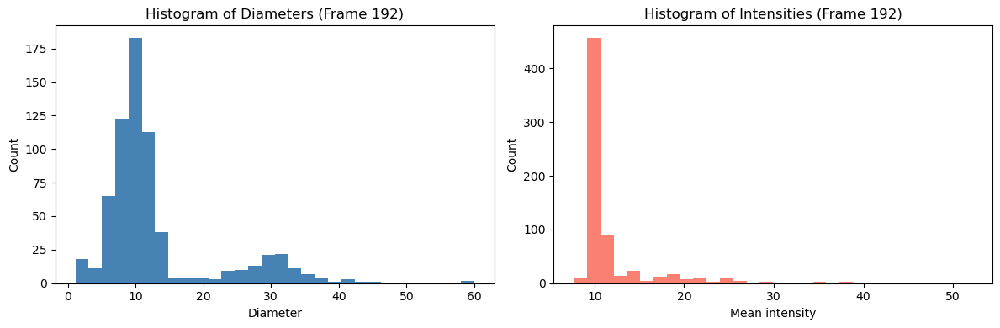

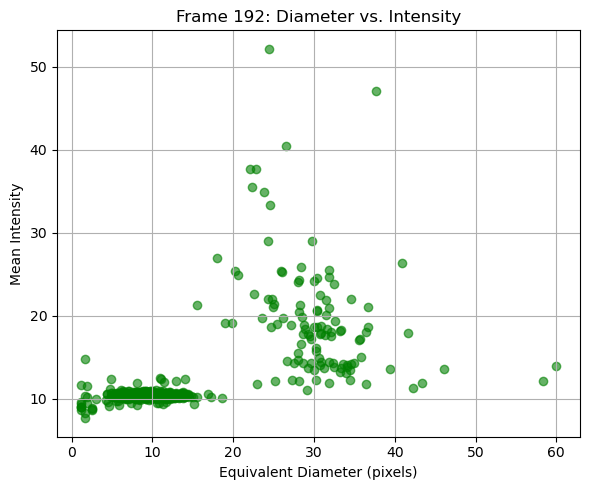

In [7]:
import os
from skimage.io import imread
from skimage.measure import label, regionprops
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm

# === Define the frame to inspect ===
frame_index = 192  # Change this to inspect other frames

# === Read the mask and image for that frame ===
mask_fname = mask_files[frame_index]
image_fname = image_files[frame_index]

mask = imread(os.path.join(mask_dir, mask_fname))
image = imread(os.path.join(image_dir, image_fname))

# Convert RGB to grayscale if needed
if image.ndim == 3:
    image = image.mean(axis=-1)

# Extract region properties
regions = regionprops(label(mask), intensity_image=image)

# Collect diameter and intensity for the selected frame
diameters = [r.equivalent_diameter for r in regions]
intensities = [r.mean_intensity for r in regions]

# === Plot histograms ===
fig, axs = plt.subplots(1, 2, figsize=(12, 4))

axs[0].hist(diameters, bins=30, color='steelblue')
axs[0].set_title(f'Histogram of Diameters (Frame {frame_index})')
axs[0].set_xlabel('Diameter')
axs[0].set_ylabel('Count')

axs[1].hist(intensities, bins=30, color='salmon')
axs[1].set_title(f'Histogram of Intensities (Frame {frame_index})')
axs[1].set_xlabel('Mean intensity')
axs[1].set_ylabel('Count')

plt.tight_layout()
plt.show()

plt.figure(figsize=(6, 5))
plt.scatter(diameters, intensities, color='green', alpha=0.6)
plt.xlabel("Equivalent Diameter (pixels)")
plt.ylabel("Mean Intensity")
plt.title(f'Frame {frame_index}: Diameter vs. Intensity')
plt.grid(True)
plt.tight_layout()
plt.show()


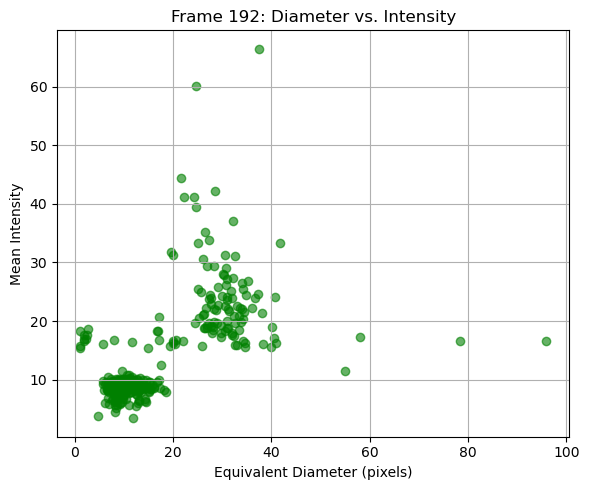

In [48]:
plt.figure(figsize=(6, 5))
plt.scatter(diameter_list_192, intensity_list_192, color='green', alpha=0.6)
plt.xlabel("Equivalent Diameter (pixels)")
plt.ylabel("Mean Intensity")
plt.title("Frame 192: Diameter vs. Intensity")
plt.grid(True)
plt.tight_layout()
plt.show()


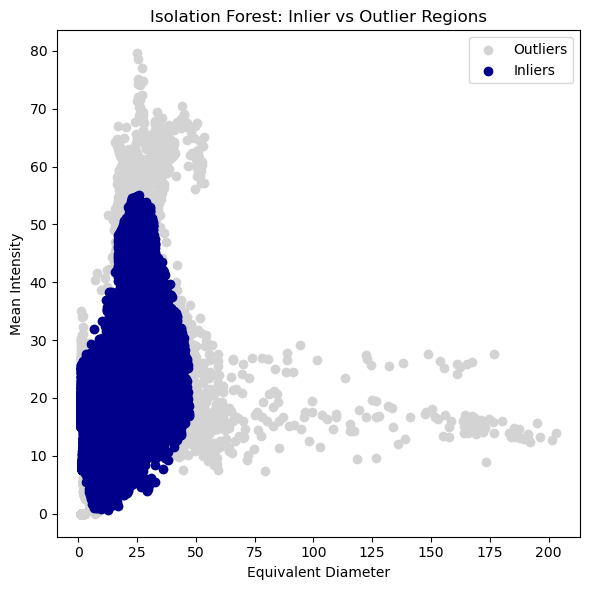

In [5]:
from sklearn.ensemble import IsolationForest

# === 1. Construct feature array for outlier detection ===
features = np.column_stack((diameter_list, intensity_list))

# === 2. Train Isolation Forest ===
iso_forest = IsolationForest(contamination=0.05, random_state=42)
inlier_mask = iso_forest.fit_predict(features) == 1  # 1 = inlier, -1 = outlier

# === 3. Filter the features to get thresholds for visualization/debugging (optional) ===
filtered_diameters = np.array(diameter_list)[inlier_mask]
filtered_intensities = np.array(intensity_list)[inlier_mask]

# === 4. Visualize what was kept ===
plt.figure(figsize=(6, 6))
plt.scatter(diameter_list, intensity_list, c='lightgray', label='Outliers')
plt.scatter(filtered_diameters, filtered_intensities, c='darkblue', label='Inliers')
plt.xlabel("Equivalent Diameter")
plt.ylabel("Mean Intensity")
plt.title("Isolation Forest: Inlier vs Outlier Regions")
plt.legend()
plt.tight_layout()
plt.show()

100%|█████████████████████████████████████████████████████████████████████████████| 289/289 [01:09<00:00,  4.13it/s]


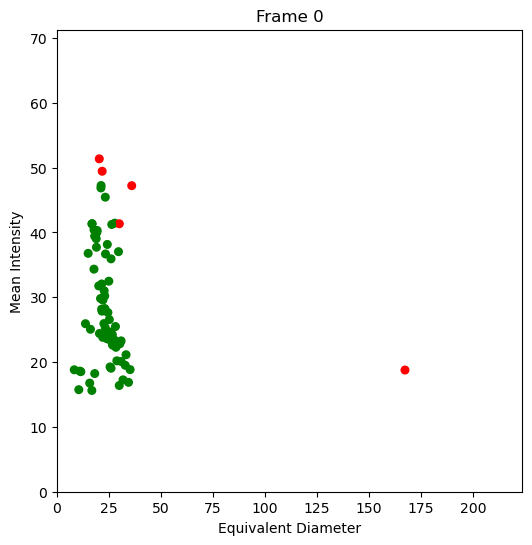

In [8]:
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from sklearn.ensemble import IsolationForest
from skimage.io import imread
from skimage.measure import regionprops, label

window_size = 20
all_frame_features = []
frame_results = []

for frame_num, (mask_fname, image_fname) in enumerate(tqdm(zip(mask_files, image_files), total=len(mask_files))):
    mask = imread(os.path.join(mask_dir, mask_fname))
    image = imread(os.path.join(image_dir, image_fname))
    if image.ndim == 3:
        image = image.mean(axis=-1)

    regions = regionprops(label(mask), intensity_image=image)
    features = [[r.equivalent_diameter, r.mean_intensity] for r in regions]
    all_frame_features.append(features)

# === Prepare all inlier/outlier labels for animation ===
for frame_num in range(len(all_frame_features)):
    window_range = range(max(0, frame_num - window_size), min(len(all_frame_features), frame_num + window_size + 1))
    training_data = [pt for f in window_range for pt in all_frame_features[f]]
    frame_data = all_frame_features[frame_num]

    if len(frame_data) == 0:
        frame_results.append((frame_data, np.ones(len(frame_data))))
        continue

    iso = IsolationForest(contamination=0.05, random_state=42)
    iso.fit(training_data)
    labels = iso.predict(frame_data)  # 1 = inlier, -1 = outlier
    frame_results.append((frame_data, labels))

# === Create animation ===
fig, ax = plt.subplots(figsize=(6, 6))

scatter = ax.scatter([], [], s=30)
ax.set_xlim(0, max([d for f in all_frame_features for d, _ in f]) * 1.1)
ax.set_ylim(0, max([i for f in all_frame_features for _, i in f]) * 1.1)
ax.set_xlabel('Equivalent Diameter')
ax.set_ylabel('Mean Intensity')
title = ax.set_title("")

def update(frame_idx):
    features, labels = frame_results[frame_idx]
    if len(features) == 0:
        scatter.set_offsets([])
        scatter.set_array(np.array([]))
    else:
        points = np.array(features)
        colors = np.where(labels == 1, 'green', 'red')
        scatter.set_offsets(points)
        scatter.set_color(colors)
    title.set_text(f'Frame {frame_idx}')
    return scatter,

ani = animation.FuncAnimation(fig, update, frames=len(frame_results), interval=200, blit=False)

# Display animation (for Jupyter notebook)
from IPython.display import HTML
HTML(ani.to_jshtml())


In [6]:
# === Filter masks and extract centroids based on diameter and intensity percentiles ===
d_low, d_high = np.percentile(diameter_list, [0, 90])
i_low, i_high = np.percentile(intensity_list, [10, 100])

print(f"Filtering diameters in range: {d_low:.2f} – {d_high:.2f}")
print(f"Filtering intensities in range: {i_low:.2f} – {i_high:.2f}")

all_points = []

for frame_num, (mask_fname, image_fname) in enumerate(tqdm(zip(mask_files, image_files), total=len(mask_files))):
    mask = imread(os.path.join(mask_dir, mask_fname))
    image = imread(os.path.join(image_dir, image_fname))
    
    if image.ndim == 3:
        image = image.mean(axis=-1)

    regions = regionprops(label(mask), intensity_image=image)

    for r in regions:
        if d_low <= r.equivalent_diameter <= d_high and i_low <= r.mean_intensity <= i_high: # only keep cells falling in both 99% confidence intervals
            y, x = r.centroid # centroid (x,y) coordinate
            all_points.append({
                'frame': frame_num,
                'y': y,
                'x': x
            })

df = pd.DataFrame(all_points)
df.head()


Filtering diameters in range: 1.13 – 34.50
Filtering intensities in range: 10.11 – 79.57


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 289/289 [01:11<00:00,  4.03it/s]


,frame,y,x
0,0,5.524194,326.842742
1,0,4.319588,2141.922680
2,0,15.059091,2146.618182
3,0,21.867710,2114.913229
4,0,78.938338,1362.713137


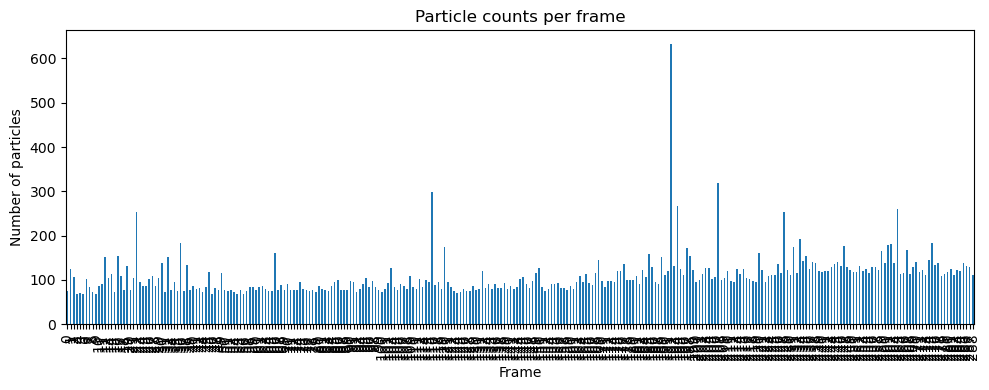

frame
192    632
207    318
116    298
194    266
264    261
Name: count, dtype: int64


In [7]:
#Count number of particles in each frame
frame_counts = df['frame'].value_counts().sort_index()

# Plot number of features per frame
plt.figure(figsize=(10, 4))
frame_counts.plot(kind='bar')
plt.xlabel('Frame')
plt.ylabel('Number of particles')
plt.title('Particle counts per frame')
plt.tight_layout()
plt.show()
print(frame_counts.sort_values(ascending=False).head())

In [ ]:
frame_id = 192

# Filter dataframe to frame 194
frame_df = df[df['frame'] == frame_id]

# Display number of particles
print(f"Number of particles in frame {frame_id}: {len(frame_df)}")

# Plot detections overlaid on original image
image = imread(os.path.join(image_dir, image_files[frame_id]))

if image.ndim == 3:
    image = image.mean(axis=-1)

plt.figure(figsize=(8, 8))
plt.imshow(image, cmap='gray')
plt.scatter(frame_df['x'], frame_df['y'], c='red', s=20, edgecolors='white', linewidths=0.5)
plt.title(f'Particles in Frame {frame_id} ({len(frame_df)} detections)')
plt.axis('off')
plt.show()


In [15]:
df_filtered = df.groupby('frame').filter(lambda x: len(x) <= 250)

In [16]:
# === Link with Trackpy ===
linked = tp.link_df(df_filtered, search_range=15, memory=3)
linked.head()

Frame 288: 127 trajectories present.


,frame,y,x,particle
0,0,5.524194,326.842742,0
36,0,859.824373,338.974910,1
37,0,971.265789,1927.892105,2
38,0,985.512472,1937.804989,3
39,0,1126.898123,1956.750670,4


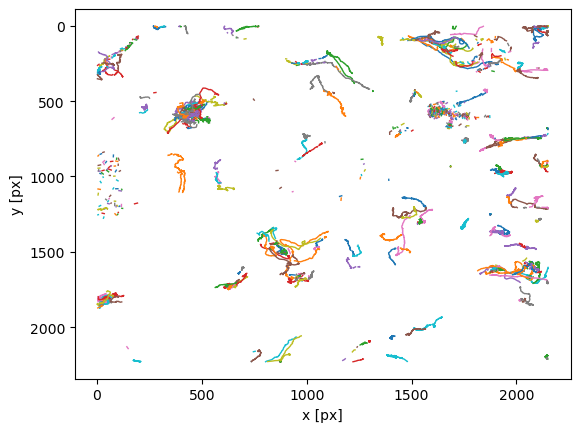

Text(24.0, 0.5, 'y')

In [46]:
ax = tp.plot_traj(linked)
ax.invert_yaxis()
ax.set_title('Tracked trajectories')
ax.set_xlabel('x')
ax.set_ylabel('y')


In [9]:
#save the tracks to a pandas dataframe
os.makedirs(czi_filename + 'tracks', exist_ok=True)
linked.to_csv(czi_filename + 'tracks/linked_tracks.csv', index=False)

#for future loading of the same dataframe:
#linked = pd.read_csv('./s28_tracks/linked_tracks.csv')

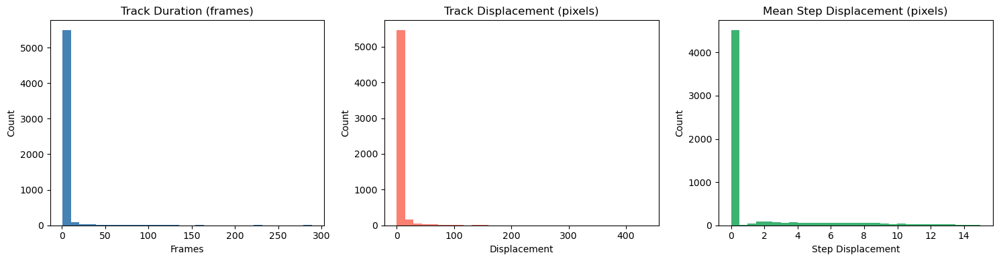

In [20]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(1, 3, figsize=(15, 4))

axs[0].hist(track_stats['duration'], bins=30, color='steelblue')
axs[0].set_title('Track Duration (frames)')
axs[0].set_xlabel('Frames')
axs[0].set_ylabel('Count')

axs[1].hist(track_stats['displacement'], bins=30, color='salmon')
axs[1].set_title('Track Displacement (pixels)')
axs[1].set_xlabel('Displacement')
axs[1].set_ylabel('Count')

axs[2].hist(track_stats['mean_step_disp'], bins=30, color='mediumseagreen')
axs[2].set_title('Mean Step Displacement (pixels)')
axs[2].set_xlabel('Step Displacement')
axs[2].set_ylabel('Count')

plt.tight_layout()
plt.show()


In [19]:
import numpy as np

# Group by particle (track ID)
track_stats = linked.groupby('particle').agg(
    start_frame=('frame', 'min'),
    end_frame=('frame', 'max'),
    duration=('frame', lambda x: x.max() - x.min() + 1),
    start_x=('x', 'first'),
    start_y=('y', 'first'),
    end_x=('x', 'last'),
    end_y=('y', 'last')
)

# Compute Euclidean displacement (start to end)
track_stats['displacement'] = np.sqrt(
    (track_stats['end_x'] - track_stats['start_x'])**2 + 
    (track_stats['end_y'] - track_stats['start_y'])**2
)

# Optional: compute mean frame-to-frame displacement to detect sudden jumps
def mean_step_disp(traj):
    coords = traj[['x', 'y']].values
    steps = np.linalg.norm(coords[1:] - coords[:-1], axis=1)
    return np.mean(steps) if len(steps) > 0 else 0

mean_displacement = linked.groupby('particle').apply(mean_step_disp)
track_stats['mean_step_disp'] = mean_displacement



          start_frame  end_frame  duration      start_x      start_y  \
particle                                                               
0                   0         95        96   326.842742     5.524194   
1                   0        288       289   338.974910   859.824373   
2                   0        288       289  1927.892105   971.265789   
3                   0        288       289  1937.804989   985.512472   
4                   0        288       289  1956.750670  1126.898123   
...               ...        ...       ...          ...          ...   
5819              287        287         1  1651.643836   564.876712   
5820              287        287         1  1655.055556   564.611111   
5821              288        288         1   648.321739    61.417391   
5822              288        288         1   505.691473   460.441860   
5823              288        288         1   942.807692   650.937500   

                end_x        end_y  displacement  mean_step_dis

/tmp/ipykernel_199040/2938550301.py:26: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  mean_displacement = linked.groupby('particle').apply(mean_step_disp)


In [22]:
min_duration = 10
min_disp = 5
max_step_disp = 15  # tweak depending on your data

valid_tracks = track_stats[
    (track_stats['duration'] >= min_duration) &
    (track_stats['displacement'] >= min_disp) &
    (track_stats['mean_step_disp'] <= max_step_disp)
].index

print(f"Kept {len(valid_tracks)} out of {len(track_stats)} tracks.")


Kept 312 out of 5824 tracks.


In [24]:
filtered_linked = linked[linked['particle'].isin(valid_tracks)].copy()
filtered_linked.to_csv(czi_filename + 'tracks/linked_tracks_filtered.csv', index=False)


In [10]:
#imports for making a movie
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from matplotlib import cm

In [30]:
#generate frames for a movie, by overlaying cell tracks

# === Parameters ===
image_dir = czi_filename + 'enhanced_rgb_frames'
output_dir = czi_filename + 'tracks/tracks_movie_frames'
os.makedirs(output_dir, exist_ok=True)
#video_path = czi_filename + 'tracks/tracks_movie.mp4'

# === Parameters ===
tail_length = 15  # number of frames to show tail history
output_dir = czi_filename + 'tracks/track_frames'
os.makedirs(output_dir, exist_ok=True)

# === Colormap setup ===
cmap = plt.get_cmap('tab10')  # change to another if you want e.g., 'gist_ncar'

# === Load base frame for size info ===
sample_img = imread(os.path.join(image_dir, image_files[0]))
height, width = sample_img.shape[:2]

for fnum, img_name in enumerate(tqdm(image_files, desc="Rendering frames with tracks")):
    vis = imread(os.path.join(image_dir, img_name))
    if vis.ndim == 3:
        vis = vis.mean(axis=-1)

    fig, ax = plt.subplots(figsize=(6, 6))
    ax.imshow(vis, cmap='gray', vmin=vis.min(), vmax=vis.max())
    ax.set_axis_off()

    # Overlay all track tails for this frame
    for pid in filtered_linked['particle'].unique():
        traj = filtered_linked[filtered_linked['particle'] == pid]
        tail = traj[(traj['frame'] <= fnum) & (traj['frame'] > fnum - tail_length)]

        if len(tail) > 1:
            ax.plot(tail['x'], tail['y'], '-', linewidth=2, alpha=0.8,
                    color=cmap(int(pid) % 10))

    # Save to file
    out_path = os.path.join(output_dir, f"{fnum:04d}.png")
    fig.savefig(out_path, dpi=100, bbox_inches='tight', pad_inches=0)
    plt.close(fig)



Rendering frames with tracks: 100%|████████████████████████████████████████████████████████████████████████████| 289/289 [08:28<00:00,  1.76s/it]


In [31]:
#combine generated frames into a movie

import subprocess

# === Define paths ===
input_pattern = czi_filename + 'tracks/track_frames/%04d.png'
output_video = czi_filename + 'tracks/track_overlay.mp4'
fps = 10  # Adjust as needed

# === FFmpeg command with padding to ensure even width/height ===
ffmpeg_cmd = [
    'ffmpeg',
    '-y',  # Overwrite output file if exists
    '-framerate', str(fps),
    '-i', input_pattern,
    '-vf', 'pad=ceil(iw/2)*2:ceil(ih/2)*2',
    '-c:v', 'libx264',
    '-pix_fmt', 'yuv420p',
    output_video
]

# === Run the command ===
print("Running FFmpeg...")
subprocess.run(ffmpeg_cmd, check=True)
print(f"Saved movie to {output_video}")


Running FFmpeg...


ffmpeg version 4.4 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 9.4.0 (GCC)
  configuration: --prefix=/home/mars/anaconda3/envs/snyder --cc=/home/conda/feedstock_root/build_artifacts/ffmpeg_1635121324509/_build_env/bin/x86_64-conda-linux-gnu-cc --disable-doc --disable-openssl --enable-avresample --enable-demuxer=dash --enable-gnutls --enable-gpl --enable-hardcoded-tables --enable-libfreetype --enable-libopenh264 --enable-libx264 --enable-libx265 --enable-libxml2 --enable-libvpx --enable-pic --enable-pthreads --enable-shared --disable-static --enable-version3 --enable-zlib --enable-libmp3lame --pkg-config=/home/conda/feedstock_root/build_artifacts/ffmpeg_1635121324509/_build_env/bin/pkg-config
  libavutil      56. 70.100 / 56. 70.100
  libavcodec     58.134.100 / 58.134.100
  libavformat    58. 76.100 / 58. 76.100
  libavdevice    58. 13.100 / 58. 13.100
  libavfilter     7.110.100 /  7.110.100
  libavresample   4.  0.  0 /  4.  0.  0
  libswscale      5.  9.100 /  5. 

Saved movie to /mnt/storage_sda/Projects/imaging_data/mix_dilution_FibronectinPDK_24hr_5x_1x_JDF_9may2025-Scene-29-E3-E03/tracks/track_overlay.mp4


frame=  289 fps= 92 q=-1.0 Lsize=     825kB time=00:00:28.60 bitrate= 236.4kbits/s speed=9.15x    
video:821kB audio:0kB subtitle:0kB other streams:0kB global headers:0kB muxing overhead: 0.477078%
[libx264 @ 0x5f84ffb340c0] frame I:2     Avg QP:17.49  size:  6712
[libx264 @ 0x5f84ffb340c0] frame P:116   Avg QP:19.75  size:  3783
[libx264 @ 0x5f84ffb340c0] frame B:171   Avg QP:20.67  size:  2270
[libx264 @ 0x5f84ffb340c0] consecutive B-frames: 13.5% 15.2% 22.8% 48.4%
[libx264 @ 0x5f84ffb340c0] mb I  I16..4: 25.0% 47.6% 27.4%
[libx264 @ 0x5f84ffb340c0] mb P  I16..4:  2.3%  4.7%  0.5%  P16..4: 47.0%  9.1% 11.2%  0.0%  0.0%    skip:25.2%
[libx264 @ 0x5f84ffb340c0] mb B  I16..4:  1.4%  2.0%  0.1%  B16..8: 47.4%  5.3%  2.1%  direct: 9.3%  skip:32.5%  L0:51.3% L1:44.5% BI: 4.3%
[libx264 @ 0x5f84ffb340c0] 8x8 transform intra:58.7% inter:73.6%
[libx264 @ 0x5f84ffb340c0] coded y,uvDC,uvAC intra: 43.1% 3.0% 1.9% inter: 27.3% 2.9% 2.6%
[libx264 @ 0x5f84ffb340c0] i16 v,h,dc,p: 35% 21% 12% 32%
[lib

In [32]:
Video(output_video, embed=True)